In [3]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [88]:
from distmetrics import compute_mahalonobis_dist_2d, get_asf_rtc_burst_ts, read_asf_rtc_image_data, compute_mahalonobis_dist_1d
from distmetrics.despeckle import despeckle_rtc_arrs_with_tv
import matplotlib.pyplot as plt
from rasterio.plot import show
import numpy as np
import asf_search as asf
from shapely.geometry import Polygon, box
from rasterio.crs import CRS
import geopandas as gpd
import pandas as pd
from tqdm import tqdm
import contextily as ctx
from pathlib import Path
import matplotlib.image as image
from PIL import Image

In [15]:
#aoi_bounds = [-71.8, -33.3,  -71.3,-32.9]
aoi = box(*aoi_bounds)
aoi_bounds = f_bounds = [-71.75, -33.2, -71.28, -33.]
#f_bounds = [-71.56, -33.2, -71.28, -33.]
aoi_bounds = f_bounds = [-71.75, -33.2, -71.28, -33.]

fire = box(*f_bounds)

df_aoi = gpd.GeoDataFrame(geometry=[aoi], crs=CRS.from_epsg(4326))
df_fire = gpd.GeoDataFrame(geometry=[fire], crs=CRS.from_epsg(4326))#.buffer(-.1)

m = df_aoi.exterior.explore()
df_fire.exterior.explore(m=m)

# Search

In [16]:
resp = asf.geo_search(intersectsWith=aoi.wkt,
                      processingLevel='RTC',
                      polarization=['VV', 'VH'],
                      platform=asf.constants.SENTINEL1)
df = gpd.GeoDataFrame.from_features(resp.geojson(), crs=CRS.from_epsg(4326))
df = df.sort_values(by='fileID').reset_index(drop=True)
df.head()

,geometry,centerLat,centerLon,stopTime,fileID,flightDirection,pathNumber,processingLevel,url,startTime,...,validityStartDate,subswath,fileName,beamModeType,s3Urls,beamMode,additionalUrls,bistaticDelayCorrection,noiseCorrection,postProcessingFilter
0,"POLYGON ((-72.42169 -33.53871, -72.36820 -33.5...",-33.343219,-71.956252,2023-10-07T23:28:50Z,OPERA_L2_RTC-S1_T018-038457-IW1_20231007T23284...,ASCENDING,18,RTC,https://datapool.asf.alaska.edu/RTC/OPERA-S1/O...,2023-10-07T23:28:47Z,...,None,IW1,OPERA_L2_RTC-S1_T018-038457-IW1_20231007T23284...,IW,[s3://asf-cumulus-prod-opera-browse/OPERA_L2_R...,IW,[https://datapool.asf.alaska.edu/RTC/OPERA-S1/...,TRUE,TRUE,FALSE
1,"POLYGON ((-72.42169 -33.53871, -72.36820 -33.5...",-33.343219,-71.956252,2023-10-07T23:28:50Z,OPERA_L2_RTC-S1_T018-038457-IW1_20231007T23284...,ASCENDING,18,RTC,https://datapool.asf.alaska.edu/RTC/OPERA-S1/O...,2023-10-07T23:28:47Z,...,None,IW1,OPERA_L2_RTC-S1_T018-038457-IW1_20231007T23284...,IW,[s3://asf-cumulus-prod-opera-browse/OPERA_L2_R...,IW,[https://datapool.asf.alaska.edu/RTC/OPERA-S1/...,TRUE,TRUE,FALSE
2,"POLYGON ((-72.42255 -33.53867, -72.36906 -33.5...",-33.343184,-71.957110,2023-10-19T23:28:50Z,OPERA_L2_RTC-S1_T018-038457-IW1_20231019T23284...,ASCENDING,18,RTC,https://datapool.asf.alaska.edu/RTC/OPERA-S1/O...,2023-10-19T23:28:47Z,...,None,IW1,OPERA_L2_RTC-S1_T018-038457-IW1_20231019T23284...,IW,[s3://asf-cumulus-prod-opera-browse/OPERA_L2_R...,IW,[https://datapool.asf.alaska.edu/RTC/OPERA-S1/...,TRUE,TRUE,FALSE
3,"POLYGON ((-72.42255 -33.53867, -72.36906 -33.5...",-33.343184,-71.957110,2023-10-19T23:28:50Z,OPERA_L2_RTC-S1_T018-038457-IW1_20231019T23284...,ASCENDING,18,RTC,https://datapool.asf.alaska.edu/RTC/OPERA-S1/O...,2023-10-19T23:28:47Z,...,None,IW1,OPERA_L2_RTC-S1_T018-038457-IW1_20231019T23284...,IW,[s3://asf-cumulus-prod-opera-browse/OPERA_L2_R...,IW,[https://datapool.asf.alaska.edu/RTC/OPERA-S1/...,TRUE,TRUE,FALSE
4,"POLYGON ((-72.42134 -33.53880, -71.91033 -33.4...",-33.342954,-71.956024,2023-10-31T23:28:50Z,OPERA_L2_RTC-S1_T018-038457-IW1_20231031T23284...,ASCENDING,18,RTC,https://datapool.asf.alaska.edu/RTC/OPERA-S1/O...,2023-10-31T23:28:47Z,...,None,IW1,OPERA_L2_RTC-S1_T018-038457-IW1_20231031T23284...,IW,[s3://asf-cumulus-prod-opera-browse/OPERA_L2_R...,IW,[https://datapool.asf.alaska.edu/RTC/OPERA-S1/...,TRUE,TRUE,FALSE


In [17]:
df['dedup_id'] = df.fileID.map(lambda id_: '_'.join(id_.split('_')[:5]))

In [18]:
df = df.drop_duplicates(subset=['dedup_id'], keep='last').reset_index(drop=True)
df.drop(columns=['dedup_id'])
df.shape

(152, 34)

In [19]:
df['url_vh'] = df.url
df['url_vv'] = df.url.map(lambda url: url.replace('VH.tif', 'VV.tif'))
df['acq_dt'] = pd.to_datetime(df.startTime)
df['acq_date'] = df.acq_dt.dt.date.astype(str)

<Axes: >

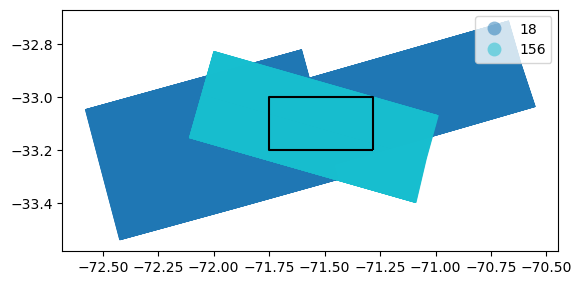

In [20]:
ax= df.plot(column='pathNumber', legend=True, categorical=True, alpha=.5)
df_aoi.exterior.plot(ax=ax, color='black')


In [21]:
# df_asc = df[df.flightDirection == 'ASCENDING'].reset_index(drop=True)
# df_dsc = df[df.flightDirection == 'DESCENDING'].reset_index(drop=True)
df_track = df[df.pathNumber == 18].reset_index(drop=True)
dates = df_track.acq_date.unique().tolist()
list(enumerate(dates))

[(0, '2023-10-07'),
 (1, '2023-10-19'),
 (2, '2023-10-31'),
 (3, '2023-11-12'),
 (4, '2023-11-24'),
 (5, '2023-12-06'),
 (6, '2023-12-18'),
 (7, '2023-12-30'),
 (8, '2024-01-11'),
 (9, '2024-01-23'),
 (10, '2024-02-04'),
 (11, '2024-02-16'),
 (12, '2024-02-28'),
 (13, '2024-03-11'),
 (14, '2024-03-23'),
 (15, '2024-04-04'),
 (16, '2024-04-16'),
 (17, '2024-04-28'),
 (18, '2024-05-10'),
 (19, '2024-05-22'),
 (20, '2024-06-03'),
 (21, '2024-06-15')]

In [23]:
from dem_stitcher.merge import merge_arrays_with_geometadata

def download_and_merge_group(urls: list[str]) -> tuple:
    imgs, profiles = read_asf_rtc_image_data(urls)
    merged_img, merged_profile = merge_arrays_with_geometadata(imgs, profiles)
    return merged_img, merged_profile 

In [24]:
N = 13

In [25]:
vv_data = [download_and_merge_group(df_track[df_track.acq_date == date].url_vv) for date in tqdm(dates[:N])]

100%|████████████████████████████████████████████████████████████████████| 13/13 [01:29<00:00,  6.89s/it]


In [26]:
vh_data = [download_and_merge_group(df[df.acq_date == date].url_vh) for date in tqdm(dates[:N])]

100%|████████████████████████████████████████████████████████████████████| 13/13 [01:29<00:00,  6.92s/it]


In [27]:
vv_arrs, vv_ps = zip(*vv_data)
vh_arrs, vh_ps = zip(*vh_data)

In [28]:
arrs_vv = [vv[0, ...] for vv in vv_arrs]
arrs_vv_d = despeckle_rtc_arrs_with_tv(arrs_vv)

arrs_vh = [vh[0, ...] for vh in vh_arrs]
arrs_vh_d = despeckle_rtc_arrs_with_tv(arrs_vh)

  0%|                                                                             | 0/13 [00:00<?, ?it/s]

  0%|                                                                             | 0/13 [00:00<?, ?it/s]

# Distance

In [29]:
M = 10

In [91]:
dist_ob = compute_mahalonobis_dist_2d(arrs_vv_d[:M],
                                      arrs_vh_d[:M],
                                      arrs_vv_d[M],
                                      arrs_vh_d[M],
                                      window_size=3)

/Users/cmarshak/bekaert-team/distmetrics/src/distmetrics/mahalanobis.py:57: RuntimeWarning: Mean of empty slice
  mu_st = np.nanmean(mu_spatial, axis=0)
/Users/cmarshak/bekaert-team/distmetrics/src/distmetrics/mahalanobis.py:75: RuntimeWarning: Mean of empty slice
  var_st = np.nanmean(var_spatial, axis=0)
/Users/cmarshak/bekaert-team/distmetrics/src/distmetrics/mahalanobis.py:139: RuntimeWarning: Mean of empty slice
  corr_st = np.nanmean(corr_s, axis=0)


In [114]:
dist_vh_ob = compute_mahalonobis_dist_1d(arrs_vh_d[5:M],
                                         arrs_vh_d[M],
                                         window_size=3)

/Users/cmarshak/bekaert-team/distmetrics/src/distmetrics/mahalanobis.py:57: RuntimeWarning: Mean of empty slice
  mu_st = np.nanmean(mu_spatial, axis=0)
/Users/cmarshak/bekaert-team/distmetrics/src/distmetrics/mahalanobis.py:75: RuntimeWarning: Mean of empty slice
  var_st = np.nanmean(var_spatial, axis=0)
/Users/cmarshak/bekaert-team/distmetrics/src/distmetrics/mahalanobis.py:292: RuntimeWarning: invalid value encountered in sqrt
  sigma = np.sqrt(sigma)


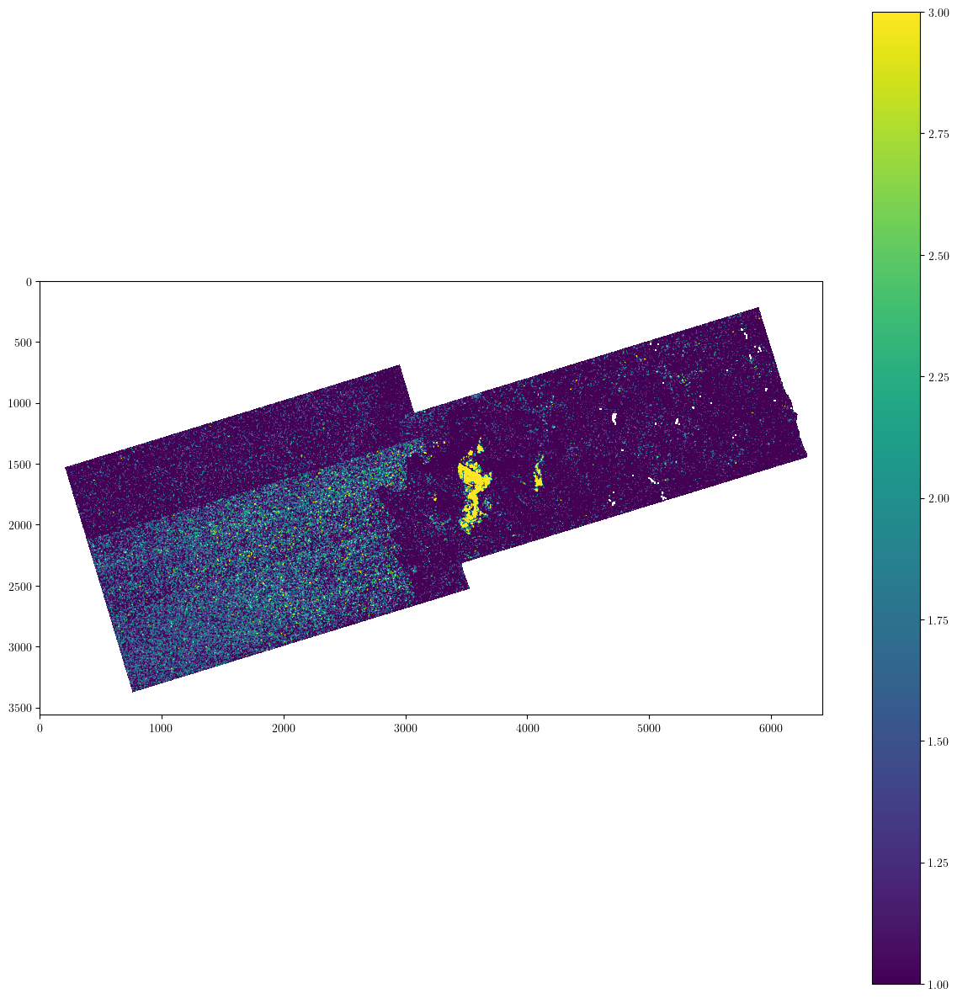

In [115]:
plt.figure(figsize=(15, 15))
plt.imshow(dist_vh_ob.dist, vmax=3, vmin=1)
plt.colorbar()

# Specific to Chile

In [116]:
df_cities = pd.read_csv('cl.csv')
df_cities = gpd.GeoDataFrame(df_cities, geometry=gpd.points_from_xy(df_cities.lng, df_cities.lat), crs=CRS.from_epsg(4326))
df_cities = df_cities.to_crs(vv_ps[0]['crs'])
df_cities.head()

,city,lat,lng,country,iso2,admin_name,capital,population,population_proper,geometry
0,Santiago,-33.4372,-70.6506,Chile,CL,Región Metropolitana,primary,7171000,236453,POINT (346564.382 6299025.290)
1,Concepción,-36.8282,-73.0514,Chile,CL,Biobío,admin,719944,223574,POINT (138627.568 5916519.954)
2,Puente Alto,-33.6167,-70.5667,Chile,CL,Región Metropolitana,minor,573935,573935,POINT (354664.989 6279241.992)
3,Maipú,-33.5167,-70.7667,Chile,CL,Región Metropolitana,NaN,521627,521627,POINT (335920.698 6290032.164)
4,La Florida,-33.5333,-70.5833,Chile,CL,Región Metropolitana,NaN,366916,366916,POINT (352983.570 6288466.519)


# Crop

In [117]:
from rasterio.warp import transform_bounds
from rasterio.crs import CRS

utm_bounds = transform_bounds(CRS.from_epsg(4326), vv_ps[0]['crs'], *f_bounds)

# Plot TS

In [118]:
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "sans-serif",
    "font.sans-serif": "Helvetica",
})

(6323170.49918047, 6346404.009897348)

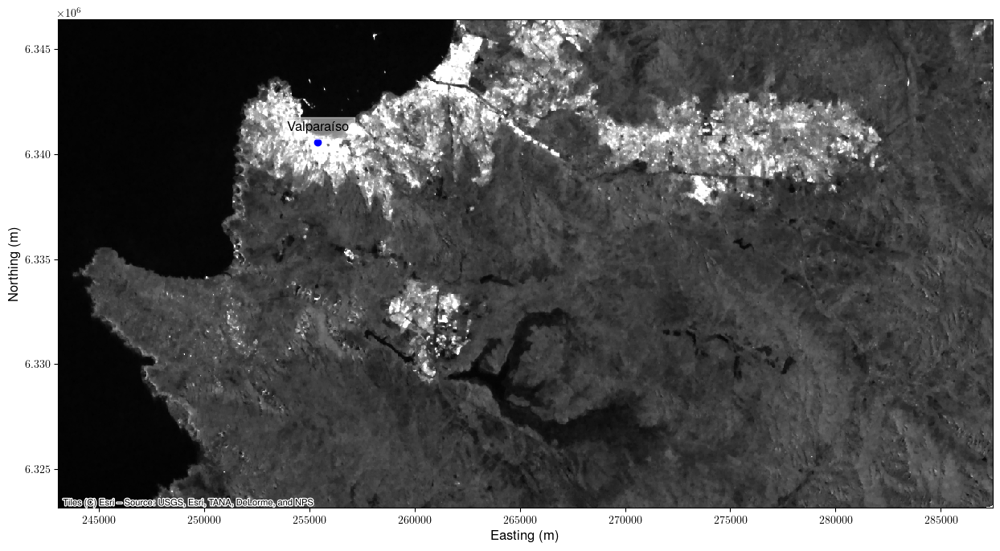

In [119]:
fig, ax = plt.subplots(figsize=(15, 10))

df_cities_p = df_cities[df_cities.city.str.contains('Valpar')]
df_cities_p.iloc[:10].plot(ax=ax, color='blue')
df_cities_p.iloc[:10].agg(lambda row: ax.annotate(text=row['city'], xy=(row['geometry'].x +60, row['geometry'].y+520), 
                                                    ha='center',  fontsize=12, color='black',  backgroundcolor=(1, 1, 1, .5)), axis=1)
show(arrs_vh_d[0], interpolation='none', transform=vv_ps[0]['transform'], ax=ax, vmin=0, vmax=.1, cmap='binary_r')
ax.set_xlabel('Easting (m)', fontsize=12)
ax.set_ylabel('Northing (m)', fontsize=12)
ctx.add_basemap(ax, crs=df_cities.crs, zorder=-1, zoom=9, source=ctx.providers['Esri']['WorldTerrain'])
ax.set_xlim(utm_bounds[0], utm_bounds[2])
ax.set_ylim(utm_bounds[1], utm_bounds[3])


# Generate a Gif

In [120]:
fire_date = '2024-02-04'

In [121]:
out_dir = Path('fire_out')
out_dir.mkdir(exist_ok=True, parents=True)

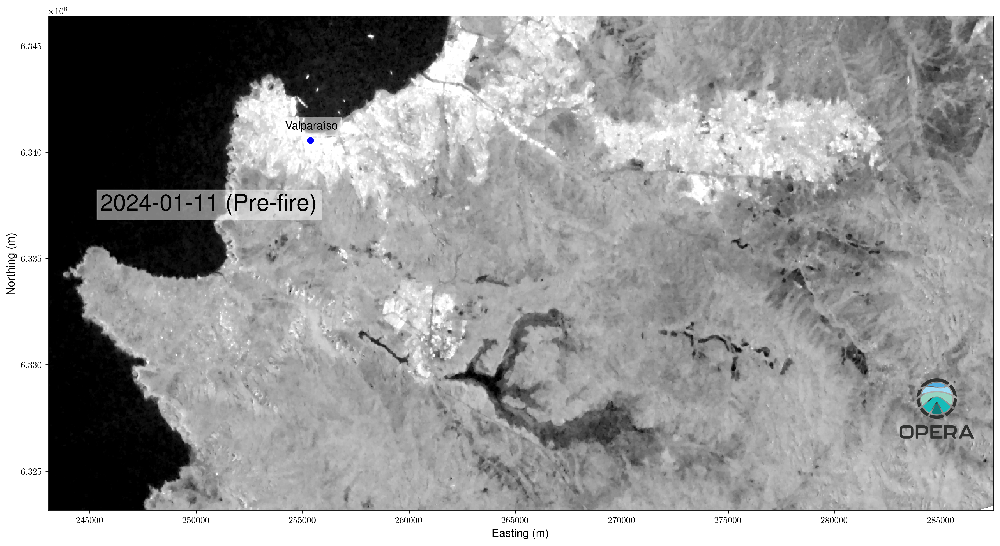

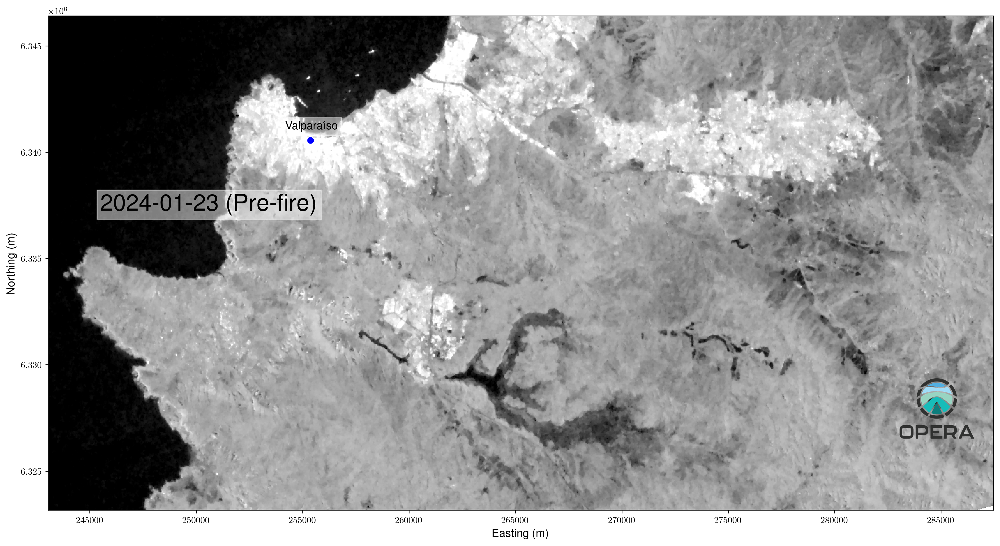

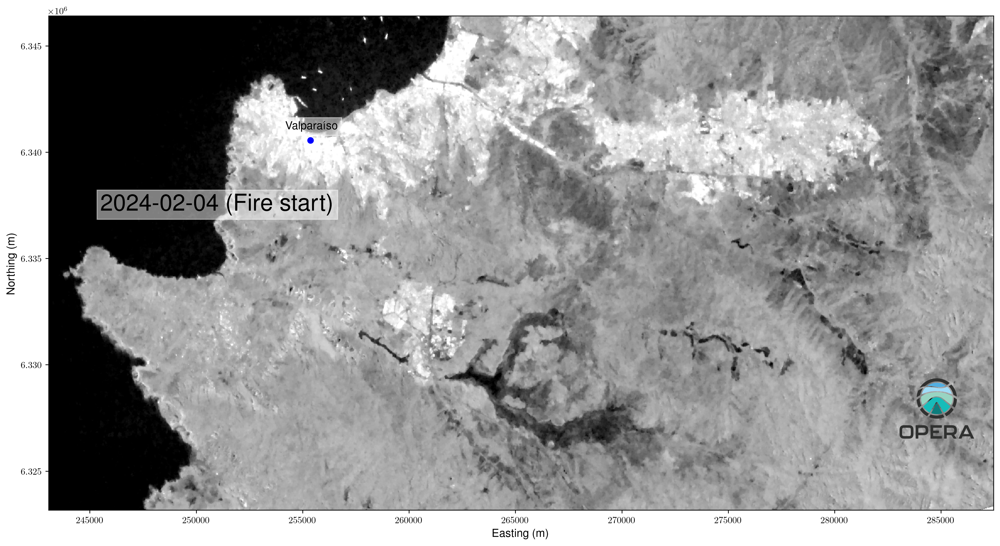

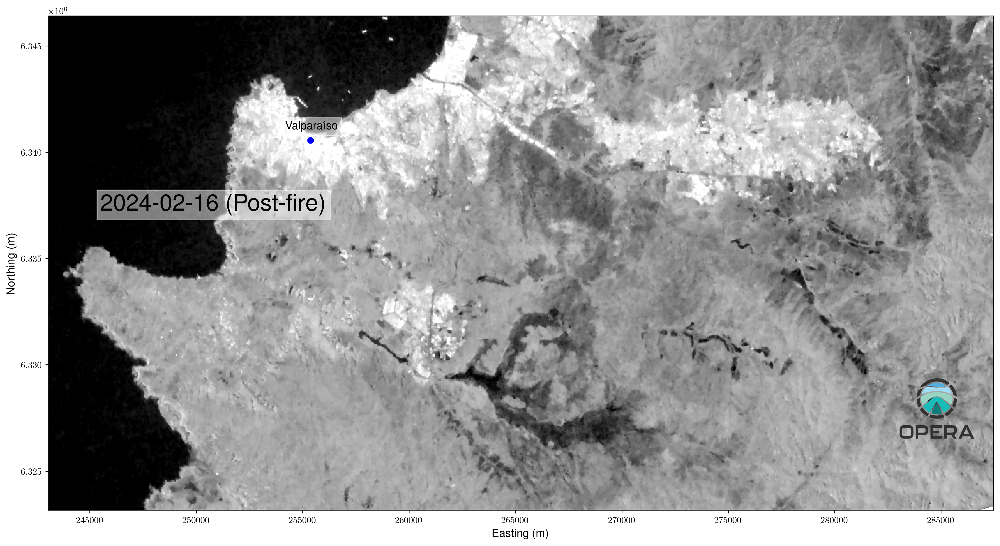

In [122]:
from PIL import Image
ts_pngs = []
inds = [8, 9, 10, 11]
data = list(zip(arrs_vh_d, dates, vh_ps))
for arr, date, p in [data[i] for i in inds]:
    fig, ax = plt.subplots(figsize=(15, 10), dpi=250)

    df_cities_p = df_cities[df_cities.city.str.contains('Valpar')]
    df_cities_p.iloc[:10].plot(ax=ax, color='blue')
    df_cities_p.iloc[:10].agg(lambda row: ax.annotate(text=row['city'], xy=(row['geometry'].x +60, row['geometry'].y+520), 
                                                    ha='center',  fontsize=12, color='black',  backgroundcolor=(1, 1, 1, .5)), axis=1)
    show(10 * np.log10(arr), interpolation='none', transform=p['transform'], ax=ax, vmin=-27, vmax=-10, cmap='binary_r')
    ax.set_xlabel('Easting (m)', fontsize=12)
    ax.set_ylabel('Northing (m)', fontsize=12)
    # ctx.add_basemap(ax, crs=df_cities.crs, zorder=-1, zoom=9, source=ctx.providers['Esri']['WorldTerrain'])
    #df_fire.to_crs(p['crs']).exterior.plot(ax=ax, color='red')

    ax.set_xlim(utm_bounds[0], utm_bounds[2])
    ax.set_ylim(utm_bounds[1], utm_bounds[3])
    
    if date < fire_date:
        ann_txt = date + ' (Pre-fire)' 
    elif date == fire_date:
        ann_txt = date + ' (Fire start)'
    else:
        ann_txt = date + ' (Post-fire)'
    ax.annotate(ann_txt, xy=(.1, .5), xycoords='figure fraction', fontsize=25, color='black', backgroundcolor=(1, 1, 1, .5))

    
    im = Image.open('opera-color.png')
    r = .25
    im2 = im.resize((int(im.width * r), int(im.height * r)))
    fig.figimage(im2, xo=3_300, yo=350, alpha=1, zorder=1)
    plt.tight_layout()


    out_path = out_dir / f'{date}-fire.png'
    plt.savefig(out_path)
    ts_pngs.append(str(out_path))
    plt.show()
    plt.close()


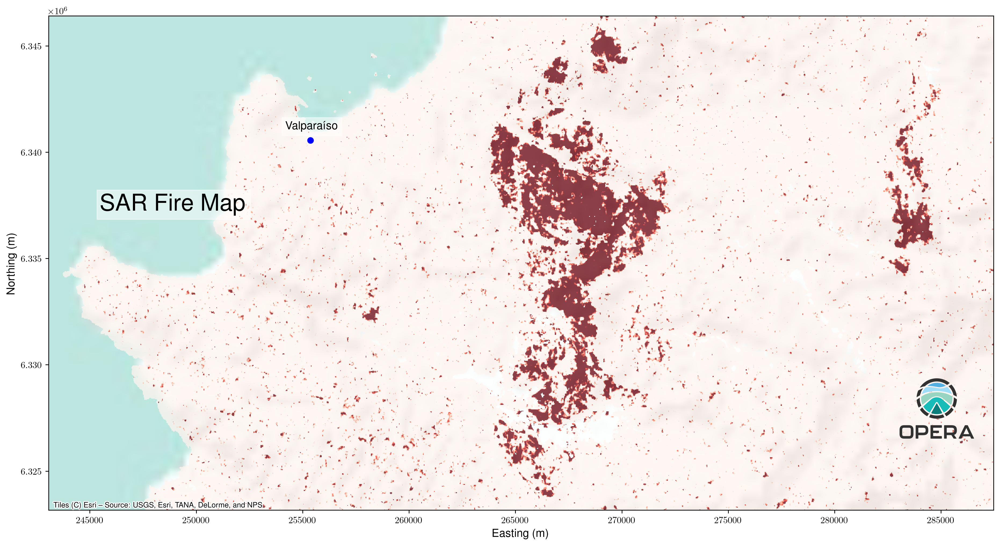

In [127]:

from PIL import Image
fig, ax = plt.subplots(figsize=(15, 10), dpi=250)

df_cities_p = df_cities[df_cities.city.str.contains('Valpar')]
df_cities_p.iloc[:10].plot(ax=ax, color='blue')
df_cities_p.iloc[:10].agg(lambda row: ax.annotate(text=row['city'], xy=(row['geometry'].x +60, row['geometry'].y+520), 
                                                ha='center',  fontsize=12, color='black',  backgroundcolor=(1, 1, 1, .5)), axis=1)
X = dist_vh_ob.dist + 0.
X[arrs_vh_d[-1] < .005] = np.nan
show(X, interpolation='none', transform=vv_ps[0]['transform'], ax=ax, vmin=2.4, vmax=4, cmap='Reds',alpha=.75)
ax.set_xlabel('Easting (m)', fontsize=12)
ax.set_ylabel('Northing (m)', fontsize=12)
ctx.add_basemap(ax, crs=df_cities.crs, zorder=-1, zoom=9, source=ctx.providers['Esri']['WorldTerrain'])
ann_txt = 'SAR Fire Map'
ax.annotate(ann_txt, xy=(.1, .5), xycoords='figure fraction', fontsize=25, color='black', backgroundcolor=(1, 1, 1, .5))
ax.set_xlim(utm_bounds[0], utm_bounds[2])
ax.set_ylim(utm_bounds[1], utm_bounds[3])

im = Image.open('opera-color.png')
r = .25
im2 = im.resize((int(im.width * r), int(im.height * r)))
fig.figimage(im2, xo=3_300, yo=350, alpha=1, zorder=1)
plt.tight_layout()
out_path = out_dir / 'fire-map.png'
plt.savefig(out_path)
plt.show()
plt.close()
ts_pngs.append(out_path)

In [128]:

# from PIL import Image
# fig, ax = plt.subplots(figsize=(15, 10), dpi=250)

# df_cities_p = df_cities[df_cities.city.str.contains('Valpar')]
# df_cities_p.iloc[:10].plot(ax=ax, color='blue')
# df_cities_p.iloc[:10].agg(lambda row: ax.annotate(text=row['city'], xy=(row['geometry'].x +60, row['geometry'].y+520), 
#                                                 ha='center',  fontsize=12, color='black',  backgroundcolor=(1, 1, 1, .5)), axis=1)
# X = dist_ob.dist + 0.
# X[arrs_vh_d[-1] < .005] = np.nan
# show(X, interpolation='none', transform=vv_ps[0]['transform'], ax=ax, vmin=2.5, vmax=3, cmap='Reds',alpha=.5)
# ax.set_xlabel('Easting (m)', fontsize=12)
# ax.set_ylabel('Northing (m)', fontsize=12)
# ctx.add_basemap(ax, crs=df_cities.crs, zorder=-1, zoom=9, source=ctx.providers['Esri']['WorldImagery'])
# ax.annotate('SAR Fire Map', xy=(.1, .8), xycoords='figure fraction', fontsize=25)
# #df_fire.to_crs(vv_ps[0]['crs']).exterior.plot(ax=ax, color='red')
# ax.set_xlim(utm_bounds[0], utm_bounds[2])
# ax.set_ylim(utm_bounds[1], utm_bounds[3])

# im = Image.open('opera-color.png')
# r = .25
# im2 = im.resize((int(im.width * r), int(im.height * r)))
# fig.figimage(im2, xo=3_300, yo=150, alpha=1, zorder=1)
# plt.tight_layout()
# out_path = out_dir / 'fire-map.png'
# plt.savefig(out_path)
# plt.show()
# plt.close()

In [129]:
from wand.image import Image

with Image() as gif:
    for file in ts_pngs:
        with Image(filename=file) as img:
            gif.sequence.append(img)
    
    for frame in gif.sequence:
        frame.delay = 100  # Set delay to 1s

    gif.type = 'optimize'
    gif.loop = 0  # Infinite loop
    gif.save(filename='ts.gif')